<a href="https://colab.research.google.com/github/Eason0227/Using-YOLO-v8-for-mask-detection/blob/main/YOLOv8_mask_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Using YOLO v8 for mask detection

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# For preparing
import xml.etree.cElementTree as ET
import glob
import os
import json
import random
import shutil

from PIL import Image, ImageOps

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
'''
annotation_directory contains files, and each file is associated to only one image,
and it contains the height and width of the image and also xmin,ymin,xmax, and ymax of each boundary box
inside the image
'''

# Tagged data in XML format
with open('/content/drive/MyDrive/Colab Notebooks/mask detection/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

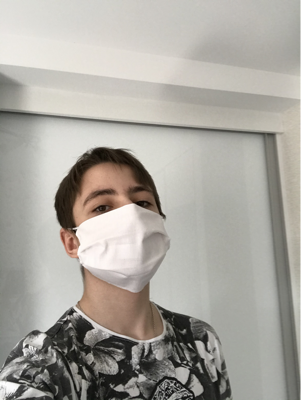

In [ ]:
# A visual from inside the data set
Image.open("/content/drive/MyDrive/Colab Notebooks/mask detection/images/maksssksksss17.png")

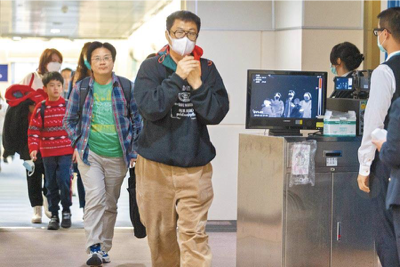

In [ ]:
# A visual from inside the data set
Image.open("/content/drive/MyDrive/Colab Notebooks/mask detection/images/maksssksksss179.png")

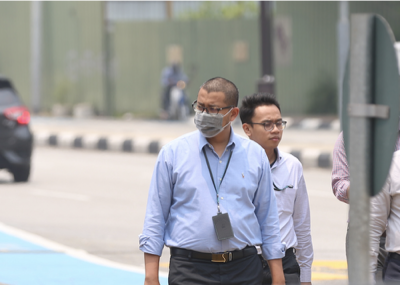

In [ ]:
# A visual from inside the data set
Image.open("/content/drive/MyDrive/Colab Notebooks/mask detection/images/maksssksksss38.png")

### Prepare Data

In [ ]:
# 將XML格式轉為TXT格式，回傳每個bounding box的x,y中心和box寬度、高度
def xml_to_yolo_bbox(bbox, w, h):
    # xmin, ymin, xmax, ymax
    x_center = ((bbox[2] + bbox[0]) / 2) / w
    y_center = ((bbox[3] + bbox[1]) / 2) / h

    width = (bbox[2] - bbox[0]) / w # 將寬度值正規化數值到0~1之間
    height = (bbox[3] - bbox[1]) / h # 將高度值正規化數值到0~1之間

    return [x_center, y_center, width, height]

classes = ["without_mask", "with_mask", "mask_weared_incorrect"]

input_dir = "/content/drive/MyDrive/Colab Notebooks/mask detection/annotations" # 物件位置標記檔案
output_dir = "/content/drive/MyDrive/Colab Notebooks/mask detection/labels" # 預測結果
image_dir = "/content/drive/MyDrive/Colab Notebooks/mask detection/images" # 訓練集圖片


if not os.path.isdir(output_dir):
    os.mkdir(output_dir)

import glob
# glob.glob()會回傳在input_dir路徑下所有副檔名為xml的檔案名稱
files = glob.glob(os.path.join(input_dir, "*.xml"))

for fil in files:
    basename = os.path.basename(fil)
    filename = os.path.splitext(basename)[0]
    if not os.path.exists(os.path.join(image_dir, f"{filename}.png")):
        print(f"{filename} image does not exist!")
        continue

    result = []

    # 解析xml檔案的內容
    tree = ET.parse(fil)
    root = tree.getroot()

    # 取得圖片的高度與寬度
    width = int(root.find("size").find("width").text)
    height = int(root.find("size").find("height").text)

    # 取得圖片中的object
    for obj in root.findall("object"):
        label = obj.find("name").text # 取得圖片中該物件的label name

        # 檢查是否有新的類別，並加入list
        if label not in classes:
          classes.append(label)
        index = classes.index(label) # 0:without mask 1:with mask 2:incorrect wear mask

        pil_bbox = [int(x.text) for x in obj.find("bndbox")] # 取得物件的bound box
        yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height) # 將物件的bound box轉為yolo的bbox

        # 將資料轉為string
        bbox_string = " ".join([str(x) for x in yolo_bbox]) #
        result.append(f"{index} {bbox_string}")

    if result:
        # 將每個xml的檔案轉為yolo格式的txt檔
        with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding = "utf-8") as f:
            f.write("\n".join(result))
# 產生類別紀錄的檔案
with open("/content/classes.txt", "w", encoding = "utf-8") as f:
    f.write(json.dumps(classes))

In [ ]:
# dataset中的每個label
with open('/content/classes.txt') as f:
    contents = f.read()
    print(contents)

["without_mask", "with_mask", "mask_weared_incorrect"]


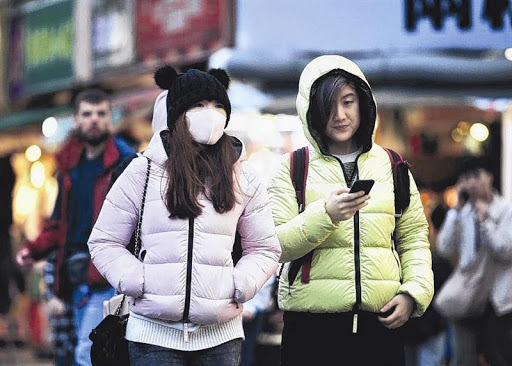

In [ ]:
# 資料集的照片
Image.open("/content/drive/MyDrive/Colab Notebooks/mask detection/images/maksssksksss0.png")

In [ ]:
# 上面照片的XML格式標籤
with open('/content/drive/MyDrive/Colab Notebooks/mask detection/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

In [ ]:
# 將XML格式轉為TXT版本的yolo格式
# 每個bounding box的label、x中心點、y中心點、高度、寬度
with open('/content/drive/MyDrive/Colab Notebooks/mask detection/labels/maksssksksss0.txt') as f:
    contents = f.read()
    print(contents)

0 0.18359375 0.337431693989071 0.05859375 0.10109289617486339
1 0.4013671875 0.3333333333333333 0.080078125 0.12021857923497267
0 0.6689453125 0.3155737704918033 0.068359375 0.13934426229508196


### Create Data For YoloV8

In [ ]:
# 創建yolo模型所需使用的訓練、驗證、測試的資料夾，分別存放label與image
if os.path.isfile("/content/drive/MyDrive/Colab Notebooks/mask detection/data"):
    print("There is folder!")
else:
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/train')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/val')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/test')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/train/images')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/train/labels')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/test/labels')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/val/images')
    os.mkdir('/content/drive/MyDrive/Colab Notebooks/mask detection/data/val/labels')

In [ ]:
# 將資料集中所有圖片的檔名存成list
metarial = []

for i in os.listdir("/content/drive/MyDrive/Colab Notebooks/mask detection/images"):
    srt = i[:-4]
    metarial.append(srt)
metarial[0:10]

['maksssksksss1',
 'maksssksksss0',
 'maksssksksss124',
 'maksssksksss128',
 'maksssksksss138',
 'maksssksksss133',
 'maksssksksss130',
 'maksssksksss136',
 'maksssksksss131',
 'maksssksksss104']

In [ ]:
# 將資料集分為訓練、驗證及測試
def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):

    # 切分訓練資料的image與label
    for i in range(0,train_size):

        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".png"

        mstring = metarial[i]# 將訓練資料的image與label txt存放到yolo的train資料夾中
        train_destination_txt = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/train/labels" + "/" + metarial[i] + ".txt"
        train_destination_png = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/train/images" + "/" + metarial[i] + ".png"

        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)

        #metarial.remove(file_name[:-4])

    # 切分測試資料的image與label
    for l in range(train_size , train_size + test_size):

        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".png"

        mstring = metarial[l] # 將測試資料的image與label txt存放到yolo的test資料夾中
        test_destination_txt = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images" + "/" + metarial[l] + ".png"

        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)

        #metarial.remove(file_name[:-4])

    # 切分驗證資料的image與label
    for n in range(train_size + test_size , train_size + test_size + val_size):

        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".png"

        mstring = metarial[n] # 將測試資料的image與label txt存放到yolo的valid資料夾中
        val_destination_txt = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/val/images" + "/" + metarial[n] + ".png"

        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)

        #metarial.remove(file_name[:-4])

In [ ]:
preparinbdata("/content/drive/MyDrive/Colab Notebooks/mask detection/labels", "/content/drive/MyDrive/Colab Notebooks/mask detection/images", 603, 150, 100)

In [ ]:
# 配置.yaml文件以引導模型進行訓練
# YAML 配置文件包含了有關模型架構、層設置、超參數等的信息
%cd /content/drive/MyDrive/Colab Notebooks/mask detection/data

yaml_text = """train: /content/drive/MyDrive/Colab Notebooks/mask detection/data/train/images
val: /content/drive/MyDrive/Colab Notebooks/mask detection/data/val/images
nc: 3
names: ["without_mask", "with_mask", "mask_weared_incorrect"]"""

with open("/content/drive/MyDrive/Colab Notebooks/mask detection/data/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat data/data.yaml

/content/drive/MyDrive/Colab Notebooks/mask detection/data
cat: data/data.yaml: No such file or directory


### YoloV8

In [ ]:
# 安裝ultralytics套件以使用YoloV8模型
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.195 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.5/78.2 GB disk)


### Training

In [ ]:

# if os.path.isfile("/content/drive/MyDrive/Colab Notebooks/mask detection/Result/"):
#     print("Dosya mevcut! (There is folder!)")
# else:
#     os.mkdir("/content/drive/MyDrive/Colab Notebooks/mask detection/Result/")

%cd /content/drive/MyDrive/Colab Notebooks/mask detection/Result/

# 使用50個epoch做YoloV8模型訓練
# data = 檔案的路徑應該是以.yaml為副檔名
# epochs = 訓練多少step
# imagsz = 這是訓練資料中圖像的大小
!yolo train model=yolov8n.pt data = "/content/drive/MyDrive/Colab Notebooks/mask detection/data/data.yaml" epochs=50 imgsz=640

/content/drive/MyDrive/Colab Notebooks/mask detection/Result
Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Colab Notebooks/mask detection/data/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, a

### result


IoU（Intersection over Union）是一個用於評估物件檢測的常用指標。它主要用於衡量預測的目標與實際目標之間的重疊程度。在電腦視覺領域中，IoU通常用於衡量模型的預測準確度。IoU的計算方式是將預測的目標區域（矩形框）與實際目標區域的交集面積除以它們的聯集面積。即IoU = intersection / union

在物件檢測中，當模型預測的目標框與實際目標框之間的IoU值越高，表示模型的預測越準確。通常，當IoU超過一個預定的閾值（例如0.5或0.7）時，可以將該預測視為成功檢測。

模型指標
* mAP50(B)："Mean Average Precision at IoU 0.50 for Large Objects”  
在IOU閾值為0.5的情況下，針對較大物件計算的平均精度（AP）值的均值。 mAP 是模型在不同類別上的平均精度值，而 mAP50(B) 是針對較大目標計算的平均精度值。

* mAP50-95(B)："Mean Average Precision across IoU 0.50 to 0.95 for Large Object"  
在範圍從0.5到0.95的IOU閾值情況下，針對較大物件計算的平均精度值的均值。這個指標更全面地評估了模型在不同重疊度下的性能。

* precision(B)：針對較大目標計算的精確率，即模型在預測為正確(True positive+ False Positive)的所有樣本中，預測真的正確的樣本(True positive)的比例，公式為precision = TP/TP+FP

* recall(B)：針對較大目標計算的召回率，即模型正確預測的目標數(True positive+False nagetive)與實際目標數(True positive)之比。它表示模型能夠檢測到多少實際目標。

* dfl_loss（Detection Focal Loss）  
Detection Focal Loss（DFL）是一種用於物體偵測任務的損失函數，它有助於解決類別不平衡問題，即正負樣本比例嚴重失衡。透過對不同樣本賦予不同的權重，在目標檢測中，負樣本（即不含目標的區域）遠遠多於正樣本（含有目標的區域）。dfl_loss 試圖通過放大難以分類的正樣本的損失，來應對這種不平衡，從而使模型更關注難以識別的目標。


* box_loss（Box Regression Loss）  
用於評估和優化模型對邊界框（bounding box）坐標的預測。這種損失函數的主要目標是測量模型預測的邊界框坐標(中心坐標、寬度和高度)與實際邊界框坐標之間的差異，並通過優化來最小化這種差異(例如均方誤差,MSE)，以提高模型的邊界框預測準確性。

* cls_loss（Class Classification Loss）  
cls_loss是YOLO模型中用於評估每個檢測寬框所預測的類別準確性的損失函數(例如Cross-Entropy Loss)，通過比較預測的類別和實際類別標籤來計算這種準確性，以優化模型的分類性能。



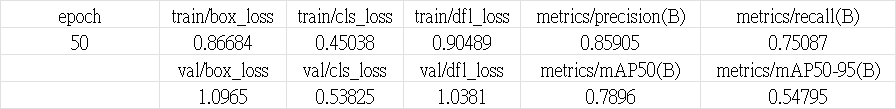

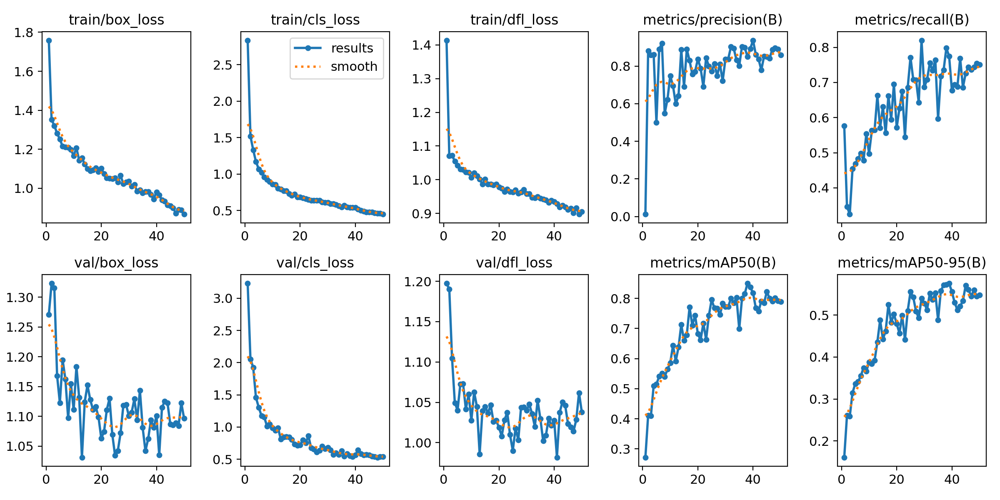

In [ ]:
Image.open("/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/train4/results.png")

### Detection

In [ ]:
# 使用訓練產生的 Best.pt 檔案對測試資料集中的影像執行測試。並使用真實的數據進行測試。
# model = 'best.pt'是訓練的模型中得分最高的step。
# soruce = 要進行檢測的影像或影像資料夾
!yolo predict model="/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/train4/weights/best.pt" source="/content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images"

Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs

image 1/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss638.png: 448x640 2 with_masks, 86.1ms
image 2/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss639.png: 384x640 4 with_masks, 92.5ms
image 3/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss64.png: 384x640 3 with_masks, 6.2ms
image 4/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss640.png: 352x640 9 with_masks, 1 mask_weared_incorrect, 68.3ms
image 5/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss641.png: 640x448 5 without_masks, 53.3ms
image 6/150 /content/drive/MyDrive/Colab Notebooks/mask detection/data/test/images/maksssksksss642.png: 640x416 2 with_masks, 56.0ms
image 7/

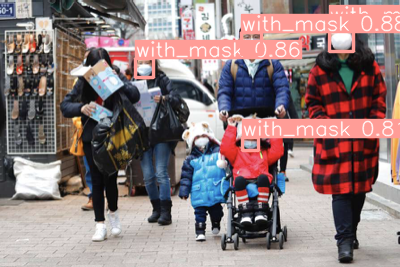

In [ ]:
# Detection result - 1

Image.open( '/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict/maksssksksss783.png' )

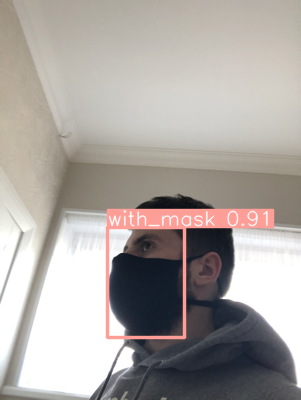

In [ ]:
# Detection result - 2
Image.open('/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict/maksssksksss78.png')

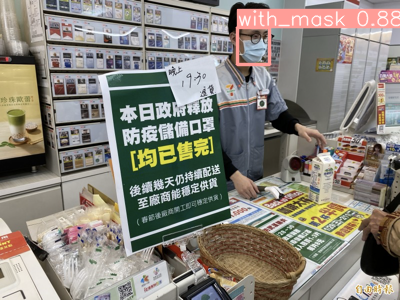

In [ ]:
# Detection result(Tespit sonucu) - 3
Image.open('/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict/maksssksksss677.png')

### Real-world data



In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/mask detection/Result
!yolo predict model="/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/train4/weights/best.pt" source='/content/drive/MyDrive/Colab Notebooks/mask detection/1668858214810.jpg'

/content/drive/MyDrive/Colab Notebooks/mask detection/Result
Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Colab Notebooks/mask detection/1668858214810.jpg: 480x640 4 without_masks, 12 with_masks, 83.9ms
Speed: 4.3ms preprocess, 83.9ms inference, 82.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


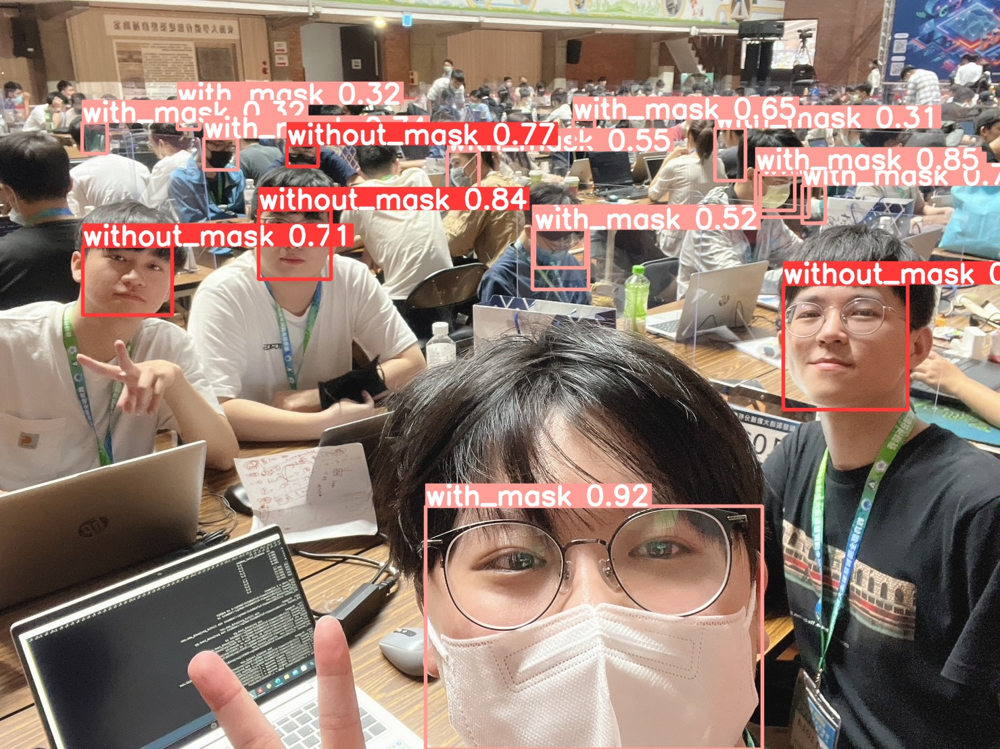

In [ ]:
Image.open('/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict3/1668858214810.jpg')

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/mask detection/Result
!yolo predict model="/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/train4/weights/best.pt" source='/content/drive/MyDrive/Colab Notebooks/mask detection/line_170656182933786.jpg'

/content/drive/MyDrive/Colab Notebooks/mask detection/Result
Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Colab Notebooks/mask detection/line_170656182933786.jpg: 480x640 2 without_masks, 3 with_masks, 62.5ms
Speed: 2.7ms preprocess, 62.5ms inference, 88.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


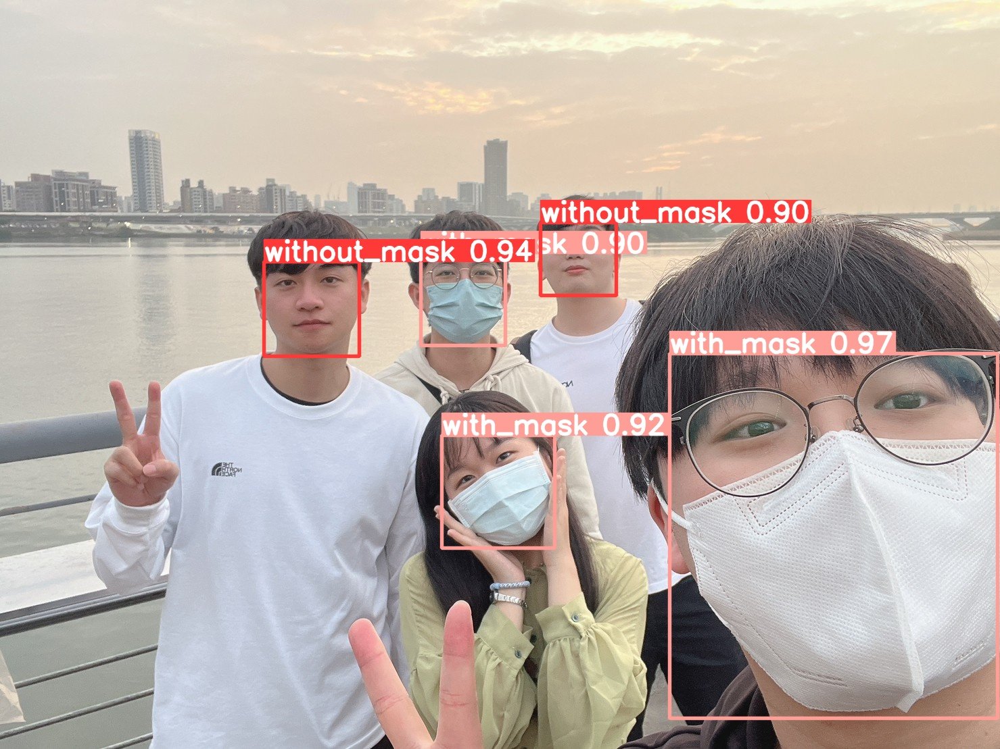

In [ ]:
Image.open('/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict5/line_170656182933786.jpg')

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/mask detection/Result
!yolo predict model="/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/train4/weights/best.pt" source='/content/drive/MyDrive/Colab Notebooks/mask detection/DSC01420.jpg'

/content/drive/MyDrive/Colab Notebooks/mask detection/Result
Ultralytics YOLOv8.0.195 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/drive/MyDrive/Colab Notebooks/mask detection/DSC01420.jpg: 384x640 4 without_masks, 2 with_masks, 1 mask_weared_incorrect, 81.3ms
Speed: 13.4ms preprocess, 81.3ms inference, 327.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


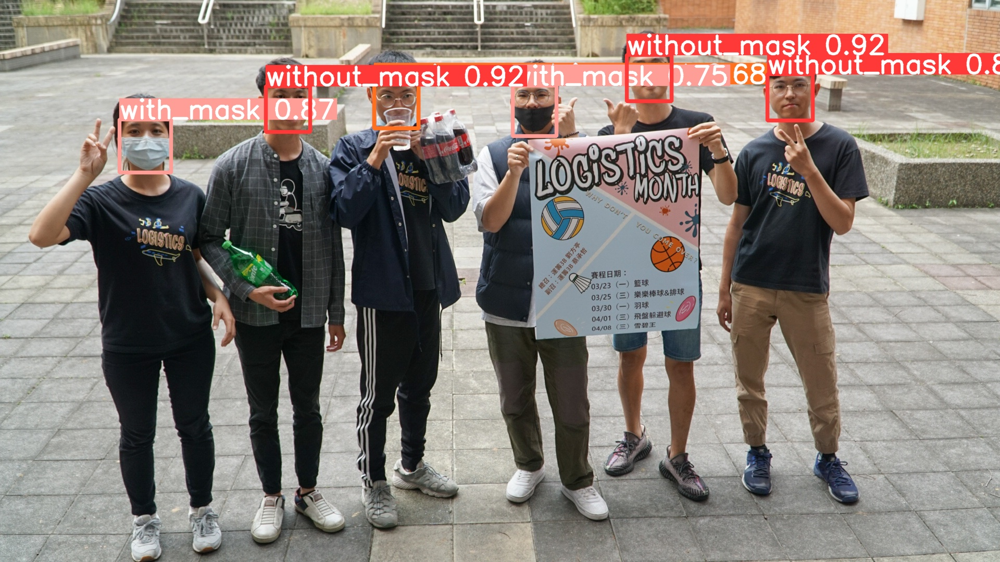

In [ ]:
Image.open('/content/drive/MyDrive/Colab Notebooks/mask detection/Result/runs/detect/predict6/DSC01420.jpg')